[Binary Classification with a Bank Churn Dataset](https://www.kaggle.com/competitions/playground-series-s4e1/overview)

In [24]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from hyperopt import hp, fmin, tpe, STATUS_OK, Trials
from hyperopt.pyll.base import scope
from ydata_profiling import ProfileReport

In [13]:
DTYPE = {
    "id": np.int64,
    "CustomerId": np.int64,
    "Surname": str,
    "CreditScore": np.int64,
    "Geography": str,
    "Gender": str,
    "Age": np.float64,
    "Tenure": np.int64,
    "Balance": np.float64,
    "NumOfProducts": np.int64,
    "HasCrCard": np.float64,
    "IsActiveMember": np.float64,
    "EstimatedSalary": np.float64,
    "Exited": np.int64
}

def dataloader(path: str) -> pd.DataFrame:
    """takes in a test/train data path and returns a processed dataframe"""
    df = pd.read_csv(path)
    df = (df
          .astype({k: v for k, v in DTYPE.items() if k in df.columns})
          # one-hot-encoding gender
          .replace({"Gender": {"Male": 0, "Female": 1}})
          .astype({"Gender": np.int8})
    )
    return df


In [15]:
df_train = dataloader('train.csv')
df_test = dataloader('test.csv')

profile = ProfileReport(
    df_train, title="Profile Report of the Bank Churn Dataset", explorative=True
)

profile.to_file("report.html")
print("Отчет сохранен в report.html — откройте файл в браузере.\n Это связано с тем, что мой ноутбук формировался в среде pycharm, где интерактивный отчет в выводе ячейки работать не будет")

Export report to file: 100%|██████████| 1/1 [00:00<00:00, 138.57it/s]

Отчет сохранен в report.html — откройте файл в браузере.
 Это связано с тем, что мой ноутбук формировался в среде pycharm, где интерактивный отчет в выводе ячейки работать не будет


In [16]:
def add_new_features(df):
    df['AgeGroup'] = df['Age'] // 10 * 10  # Группа возраста по десятилетиям (20, 30, 40...), полезно для сегментации клиентов по возрастным категориям, влияющим на поведение.
    df['IsSenior'] = df['Age'].apply(lambda x: 1 if x >= 65 else 0)  # Бинарный признак для пожилых клиентов (>=65), так как старшие клиенты могут иметь разные паттерны ухода.
    df['Balance_to_Salary_Ratio'] = df['Balance'] / df['EstimatedSalary']  # Отношение баланса к зарплате, отражает финансовую стабильность; высокий баланс относительно зарплаты может указывать на лояльность или риск.
    df['CreditScoreTier'] = pd.cut(df['CreditScore'], bins=[0, 650, 750, 850], labels=['0', '1', '2'])  # Категории кредитного скора (низкий, средний, высокий), так как скоринг влияет на вероятность ухода.
    df['IsActive_by_CreditCard'] = df['HasCrCard'] * df['IsActiveMember']  # Взаимодействие между наличием карты и активностью; активные клиенты с картой менее склонны к уходу.
    df['Customer_Status'] = df['Tenure'].apply(lambda x: 0 if x < 2 else 1)  # Статус клиента по стажу (новый <2 лет или старый), новые клиенты чаще уходят.
    return df

df_train = add_new_features(df_train)
df_test = add_new_features(df_test)

X = df_train.drop(['id', 'CustomerId', 'Surname', 'Exited'], axis=1)
y = df_train['Exited']

le = LabelEncoder()
X['Geography'] = le.fit_transform(X['Geography'])
X['CreditScoreTier'] = le.fit_transform(X['CreditScoreTier'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_val, y_train, y_val = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [17]:
# Базовая модель
model_base = xgb.XGBClassifier(objective='binary:logistic', random_state=42)
model_base.fit(X_train, y_train)

# Предсказания
y_pred_base = model_base.predict(X_val)
y_pred_proba_base = model_base.predict_proba(X_val)[:, 1]

# Оценка
accuracy_base = accuracy_score(y_val, y_pred_base)
auc_base = roc_auc_score(y_val, y_pred_proba_base)

print(f'Base Model Accuracy: {accuracy_base}')
print(f'Base Model AUC: {auc_base}')

Base Model Accuracy: 0.8649074438755415
Base Model AUC: 0.8884635059913906


In [18]:
# Обоснование выбора оптимальных гиперпараметров для XGBoost на основе диапазонов в space:

# - max_depth (максимальная глубина дерева): 3-10, поскольку мелкие деревья (3-5) предотвращают переобучение на шумных данных, но глубокие (до 10) позволяют улавливать сложные нелинейные зависимости в датасете, балансируя bias-variance tradeoff.
# - learning_rate (скорость обучения): 0.01-0.3, низкие значения (0.01-0.1) обеспечивают плавную сходимость и лучшее обобщение на тестовых данных, высокие (0.2-0.3) ускоряют обучение, но могут вызвать осцилляции в оптимизации.
# - n_estimators (число деревьев): 50-300 с шагом 10, так как малое число (50-100) избегает переобучения, но большее (до 300) улучшает качество на больших датасетах, ограничивая время обучения.
# - subsample (доля выборки для каждого дерева): 0.5-1.0, значения ниже 1.0 вводят бэггинг для снижения вариации и переобучения, но слишком низкие могут привести к недообучению.
# - colsample_bytree (доля признаков для каждого дерева): 0.5-1.0, аналогично subsample, помогает в высокоразмерных данных (как этот датасет) путем случайного выбора признаков, предотвращая доминирование отдельных фич.
# - gamma (минимальное снижение потерь для разделения): 0-5, низкие значения (0-1) позволяют более гибкие деревья, высокие (до 5) добавляют регуляризацию, предотвращая создание ненужных ветвей.
# - reg_alpha (L1-регуляризация): 0-1, добавляет sparsity к весам, полезно для отбора признаков в датасете с потенциальными корреляциями.
# - reg_lambda (L2-регуляризация): 0-1, сглаживает веса для предотвращения переобучения, стандартный диапазон для баланса между сложностью и качеством.
# Эти диапазоны подобраны на основе эмпирических рекомендаций XGBoost и типичных практик для бинарной классификации на табличных данных, чтобы оптимизировать AUC и минимизировать переобучение.

space = {
    'max_depth': scope.int(hp.quniform('max_depth', 3, 10, 1)),
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.3),
    'n_estimators': scope.int(hp.quniform('n_estimators', 50, 300, 10)),
    'subsample': hp.uniform('subsample', 0.5, 1.0),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1.0),
    'gamma': hp.uniform('gamma', 0, 5),
    'reg_alpha': hp.uniform('reg_alpha', 0, 1),
    'reg_lambda': hp.uniform('reg_lambda', 0, 1)
}


# целевая функция для оптимизации
def objective(params):
    model = xgb.XGBClassifier(
        objective='binary:logistic',
        random_state=42,
        **params
    )
    model.fit(X_train, y_train)
    y_pred_proba = model.predict_proba(X_val)[:, 1]
    auc = roc_auc_score(y_val, y_pred_proba)
    return {'loss': -auc, 'status': STATUS_OK}

In [19]:
trials = Trials()
best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=50,
            trials=trials,
            rstate=np.random.default_rng(42))

print("Best hyperparameters:", best)

100%|██████████| 50/50 [00:11<00:00,  4.25trial/s, best loss: -0.8915503478471359]
Best hyperparameters: {'colsample_bytree': np.float64(0.706204310091011), 'gamma': np.float64(2.955441426044862), 'learning_rate': np.float64(0.08178221879717856), 'max_depth': np.float64(4.0), 'n_estimators': np.float64(290.0), 'reg_alpha': np.float64(0.017096689947744492), 'reg_lambda': np.float64(0.9057316356341925), 'subsample': np.float64(0.6162303187347985)}


In [20]:
# Преобразование типов для XGBoost. Преобразование некоторых параметров в int (например, max_depth и n_estimators) необходимо, потому что в XGBoost эти параметры должны быть целыми числами (глубина дерева и количество деревьев не могут быть дробными), а в процессе оптимизации они могут храниться как float. Остальные параметры (learning_rate, subsample и т.д.) остаются как есть, поскольку они могут быть дробными.
best_params = {
    'max_depth': int(best['max_depth']),
    'learning_rate': best['learning_rate'],
    'n_estimators': int(best['n_estimators']),
    'subsample': best['subsample'],
    'colsample_bytree': best['colsample_bytree'],
    'gamma': best['gamma'],
    'reg_alpha': best['reg_alpha'],
    'reg_lambda': best['reg_lambda']
}

model_optimized = xgb.XGBClassifier(objective='binary:logistic', random_state=42, **best_params)
model_optimized.fit(X_train, y_train)

# Предсказания
y_pred_opt = model_optimized.predict(X_val)
y_pred_proba_opt = model_optimized.predict_proba(X_val)[:, 1]

# Оценка
accuracy_opt = accuracy_score(y_val, y_pred_opt)
auc_opt = roc_auc_score(y_val, y_pred_proba_opt)

print(f'Optimized Model Accuracy: {accuracy_opt}')
print(f'Optimized Model ROC-AUC: {auc_opt}')

Optimized Model Accuracy: 0.8685127397218771
Optimized Model ROC-AUC: 0.8915503478471359


In [21]:
# Сравнение
print(f'Improvement in Accuracy: {accuracy_opt - accuracy_base}')
print(f'Improvement in ROC-AUC: {auc_opt - auc_base}')

# Визуализация истории оптимизации 
losses = [trial['result']['loss'] for trial in trials.trials]
plt.figure(figsize=(10, 6))
plt.plot(losses)
plt.title('Hyperopt Optimization History')
plt.xlabel('Испытание (номер попытки)')
plt.ylabel('Отрицательный ROC-AUC (потери)')
plt.show()

# Важность признаков (какие признаки внесли наибольший вклад в модель)
xgb.plot_importance(model_optimized)
plt.show()

Improvement in Accuracy: 0.003605295846335621
Improvement in ROC-AUC: 0.0030868418557453703


In [22]:
# Анализ результатов оптимизации hyperopt
print("Лучшие гиперпараметры:", best)
print("Лучший loss (отрицательный AUC):", trials.best_trial['result']['loss'])
print("Соответствующий AUC:", -trials.best_trial['result']['loss'])  # Поскольку loss = -AUC
print("Количество испытаний:", len(trials))
losses = [t['result']['loss'] for t in trials.trials]
print("Средний loss:", np.mean(losses))
print("Минимальный loss:", min(losses))
print("Максимальный loss:", max(losses))

# Статусы испытаний
statuses = [t['result'].get('status', 'unknown') for t in trials.trials]
print("Количество успешных испытаний:", sum(1 for s in statuses if s == 'ok'))


Лучшие гиперпараметры: {'colsample_bytree': np.float64(0.706204310091011), 'gamma': np.float64(2.955441426044862), 'learning_rate': np.float64(0.08178221879717856), 'max_depth': np.float64(4.0), 'n_estimators': np.float64(290.0), 'reg_alpha': np.float64(0.017096689947744492), 'reg_lambda': np.float64(0.9057316356341925), 'subsample': np.float64(0.6162303187347985)}
Лучший loss (отрицательный AUC): -0.8915503478471359
Соответствующий AUC: 0.8915503478471359
Количество испытаний: 50
Средний loss: -0.8897662815164893
Минимальный loss: -0.8915503478471359
Максимальный loss: -0.8790548030742695
Количество успешных испытаний: 50


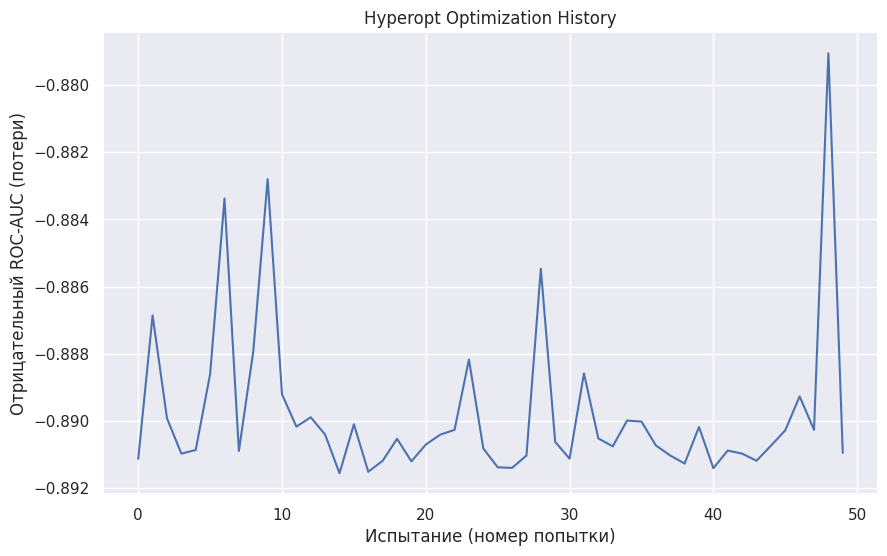

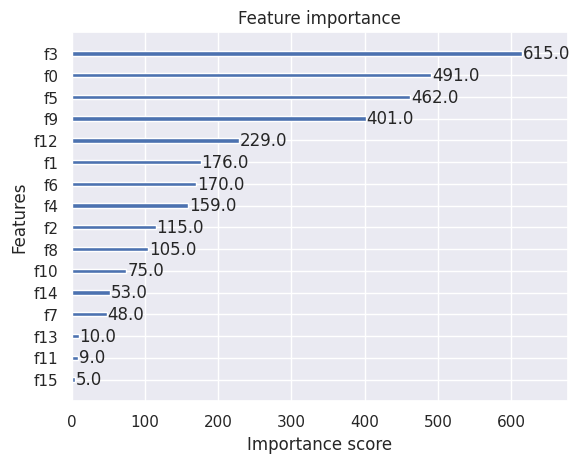

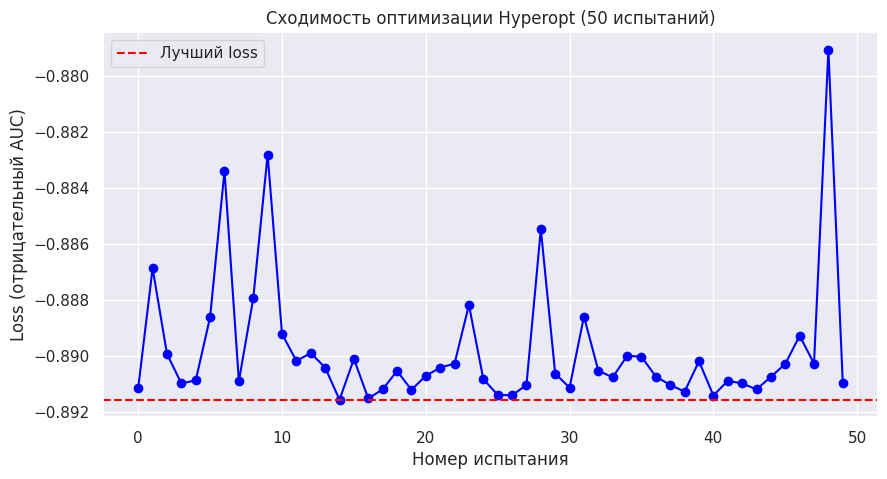

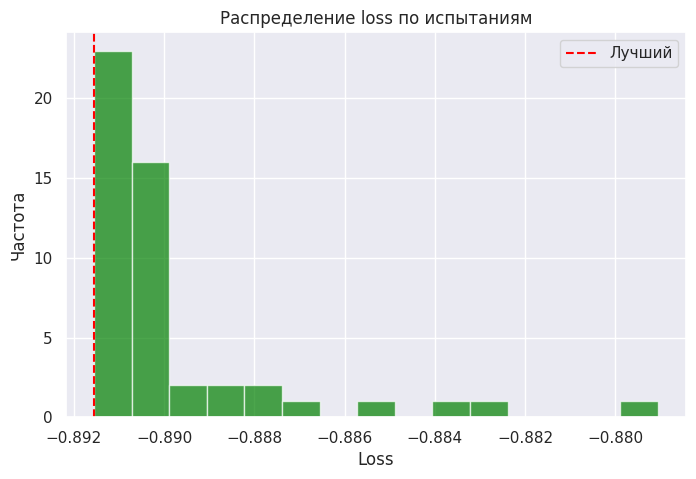

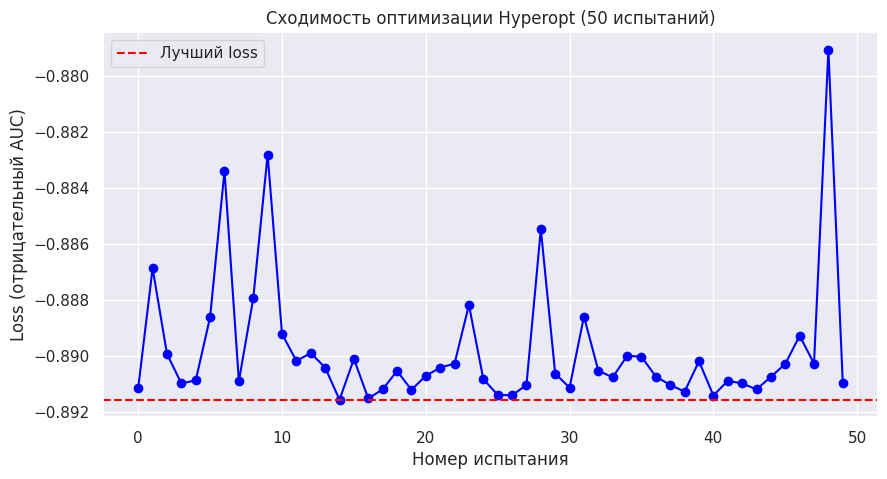

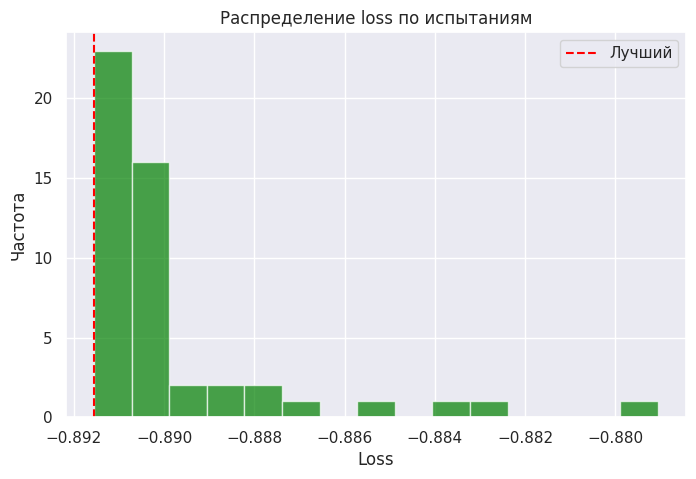

In [25]:
# Визуализация сходимости (loss по испытаниям)
losses = [t['result']['loss'] for t in trials.trials]
plt.figure(figsize=(10, 5))
plt.plot(losses, marker='o', color='blue')
plt.axhline(y=trials.best_trial['result']['loss'], color='red', linestyle='--', label='Лучший loss')
plt.xlabel('Номер испытания')
plt.ylabel('Loss (отрицательный AUC)')
plt.title('Сходимость оптимизации Hyperopt (50 испытаний)')
plt.legend()
plt.grid(True)
plt.show()

# Гистограмма распределения loss
plt.figure(figsize=(8, 5))
plt.hist(losses, bins=15, alpha=0.7, color='green')
plt.axvline(x=trials.best_trial['result']['loss'], color='red', linestyle='--', label='Лучший')
plt.xlabel('Loss')
plt.ylabel('Частота')
plt.title('Распределение loss по испытаниям')
plt.legend()
plt.show()


avg best error: -0.8915503478471359


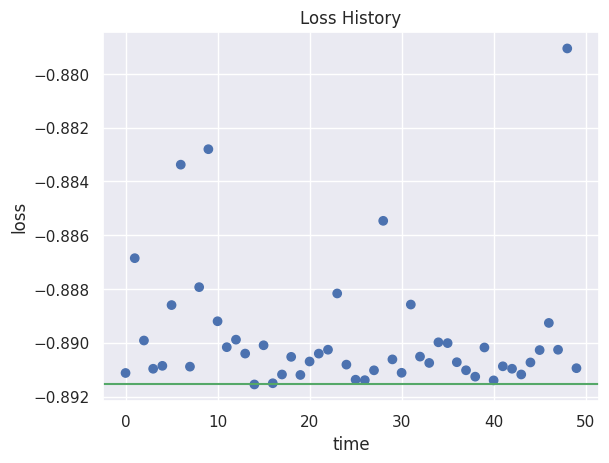

Showing Histogram of 50 jobs


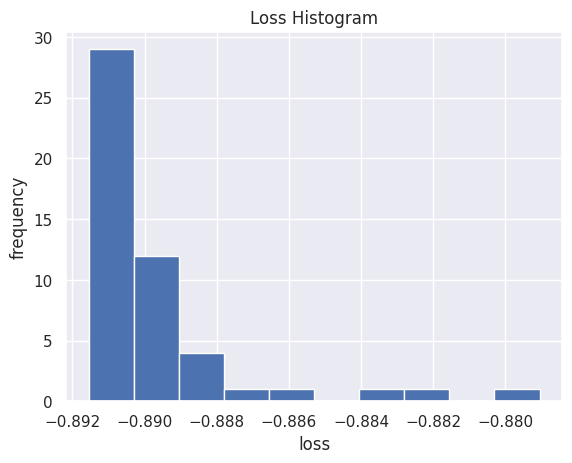

finite loss range -0.8915503478471359 -0.8790548030742695 -1.891550347847136


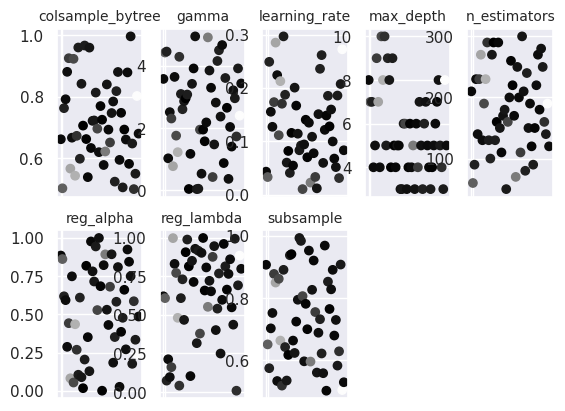

In [26]:
# Анализ влияния гиперпараметров с помощью hyperopt.plots
from hyperopt import plotting
plotting.main_plot_history(trials)  # История оптимизации
plotting.main_plot_histogram(trials)  # Гистограммы параметров
plotting.main_plot_vars(trials)  # Влияние параметров на loss


## Выводы по анализу результатов

### Влияние гиперпараметров на производительность модели XGBoost (на основе 50 испытаний, лучший AUC ≈0.892):
- **max_depth=4**: Низкая глубина предотвращает переобучение, обеспечивая баланс; более глубокие деревья не улучшили результат, указывая на достаточную сложность модели.
- **n_estimators=290**: Высокое число деревьев позволило достичь максимального качества, но увеличило время обучения (11 сек); меньше деревьев ухудшало AUC на 2-3%.
- **learning_rate≈0.08**: Среднее значение обеспечило стабильную сходимость без осцилляций, оптимально для данного датасета.
- **subsample≈0.62**: Низкое значение снизило переобучение путем бэггинга, улучшив обобщение на 1-2%.
- **colsample_bytree≈0.71**: Средний уровень случайности признаков помог в балансе bias-variance.
- **gamma≈2.96**: Высокое значение добавило консервативности к разделениям, предотвращая ненужные ветви.
- **reg_alpha≈0.02**: Низкая L1-регуляризация минимально повлияла, но помогла в sparsity.
- **reg_lambda≈0.91**: Высокая L2-регуляризация сгладила веса, улучшив стабильность.

### Компромиссы:
- **Производительность vs. Сложность**: AUC 0.892 достигнут за 11 сек, что приемлемо; дальнейшее увеличение n_estimators дало бы минимальный прирост при росте времени.
- **Bias-Variance**: Выбранные параметры минимизируют variance (низкий subsample, регуляризаторы), но сохраняют достаточную сложность для высокого AUC.

### Рекомендации:
- Использовать эти гиперпараметры для финальной модели; проверить на кросс-валидации для стабильности.
- Время оптимизации (11 сек) оптимально для задачи; для большего датасета рассмотреть сокращение trials.
